# Get TDX-Hydro Hydrography from AWS via GEOGLOWS Hydrological Model Version

[GEOGloWS v2 Data Guide - GIS Streams and Catchments](https://data.geoglows.org/dataset-descriptions/gis-streams-and-catchments)

Amazon Web Services (AWS) Resources:
- AWS Marketplace: https://aws.amazon.com/marketplace/pp/prodview-aboaljwcz64zs  
- AWS Browse Bucket: http://geoglows-v2.s3-website-us-west-2.amazonaws.com/#streams/  


In [3]:
import os
from pathlib import Path
import s3fs
import geopandas as gpd
import pyogrio
import time
import matplotlib.pyplot as plt
# import contextily as ctx
# import xarray

In [4]:
# Confirm environment
os.environ['CONDA_DEFAULT_ENV']

'hydrography'

# Explore S3 Bucket with Streams Data

In [5]:
bucket_uri = 's3://geoglows-v2'
region_name = 'us-west-2'
s3 = s3fs.S3FileSystem(anon=True, client_kwargs=dict(region_name=region_name))

In [6]:
s3.ls(bucket_uri)

['geoglows-v2/configs',
 'geoglows-v2/index.html',
 'geoglows-v2/licenses.md',
 'geoglows-v2/streams',
 'geoglows-v2/streams-global',
 'geoglows-v2/tables',
 'geoglows-v2/tdxhydro-processing',
 'geoglows-v2/v2-master-table.parquet']

In [7]:
s3.ls('geoglows-v2/streams-global')

['geoglows-v2/streams-global/',
 'geoglows-v2/streams-global/geoglows-v2-map-optimized.gdb.zip',
 'geoglows-v2/streams-global/global_streams_simplified.gpkg',
 'geoglows-v2/streams-global/vpu-boundaries.gpkg']

In [11]:
s3.ls('geoglows-v2/tables')

['geoglows-v2/tables/package-metadata-table.parquet',
 'geoglows-v2/tables/v2-countries-table.parquet',
 'geoglows-v2/tables/v2-model-table.parquet']

In [8]:
s3.ls('geoglows-v2/streams')[:4]

['geoglows-v2/streams/streams_101.gpkg',
 'geoglows-v2/streams/streams_102.gpkg',
 'geoglows-v2/streams/streams_103.gpkg',
 'geoglows-v2/streams/streams_104.gpkg']

In [9]:
len(s3.ls('geoglows-v2/streams'))

125

In [10]:
s3.ls('geoglows-v2/streams', detail=True)[:4]

[{'Key': 'geoglows-v2/streams/streams_101.gpkg',
  'LastModified': datetime.datetime(2024, 2, 1, 18, 28, 42, tzinfo=tzutc()),
  'ETag': '"bcca189e005598383ee077996cde1b82-33"',
  'Size': 269676544,
  'StorageClass': 'INTELLIGENT_TIERING',
  'type': 'file',
  'size': 269676544,
  'name': 'geoglows-v2/streams/streams_101.gpkg'},
 {'Key': 'geoglows-v2/streams/streams_102.gpkg',
  'LastModified': datetime.datetime(2024, 2, 1, 18, 28, 42, tzinfo=tzutc()),
  'ETag': '"f5c56447ec30cad5901d9312bcebf652-49"',
  'Size': 410341376,
  'StorageClass': 'INTELLIGENT_TIERING',
  'type': 'file',
  'size': 410341376,
  'name': 'geoglows-v2/streams/streams_102.gpkg'},
 {'Key': 'geoglows-v2/streams/streams_103.gpkg',
  'LastModified': datetime.datetime(2024, 2, 1, 18, 28, 42, tzinfo=tzutc()),
  'ETag': '"b743d15fb38d65b0b3d615d8cb1d71ed-74"',
  'Size': 613355520,
  'StorageClass': 'INTELLIGENT_TIERING',
  'type': 'file',
  'size': 613355520,
  'name': 'geoglows-v2/streams/streams_103.gpkg'},
 {'Key': 'geo

## Open and Visualize Data (geopandas)

streams_101.gpkg
Size:  269676544
Download time: 28.19693398475647 seconds
Read time: 3.22027325630188 seconds


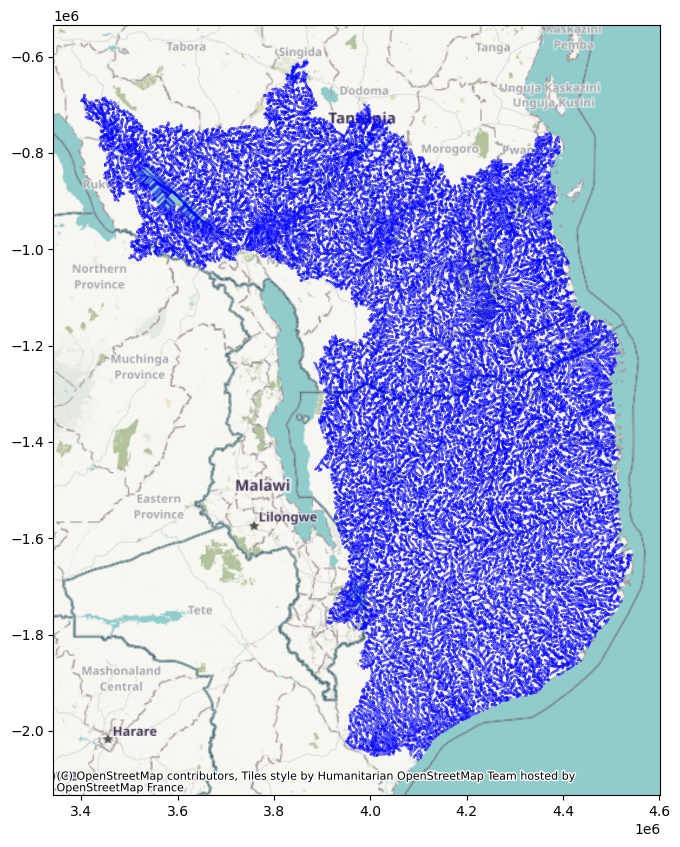

streams_102.gpkg
Size:  410341376
Download time: 39.29628586769104 seconds
Read time: 5.838531494140625 seconds


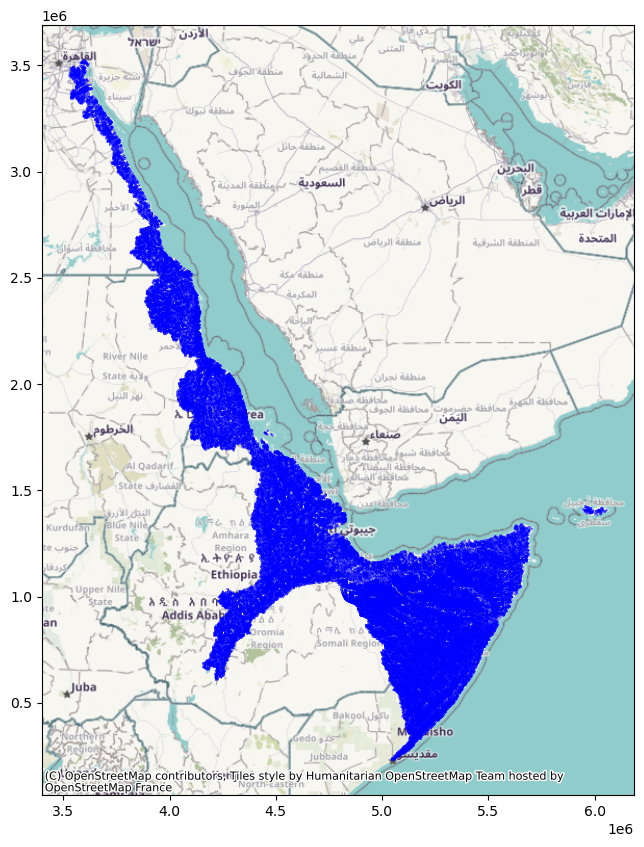

streams_103.gpkg
Size:  613355520
Download time: 65.98162651062012 seconds
Read time: 7.579495429992676 seconds


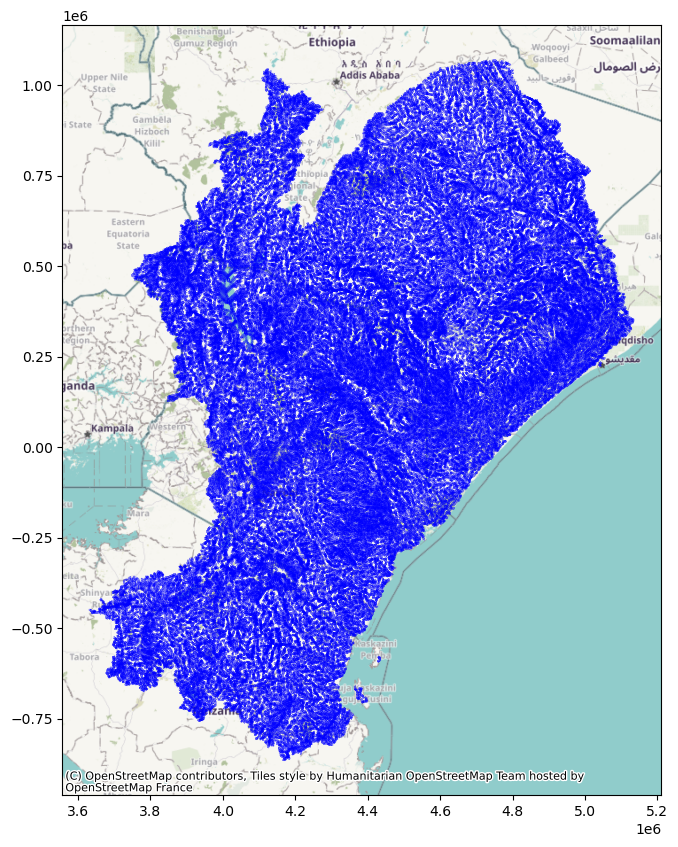

streams_104.gpkg
Size:  192995328
Download time: 24.148325204849243 seconds
Read time: 0.9555246829986572 seconds


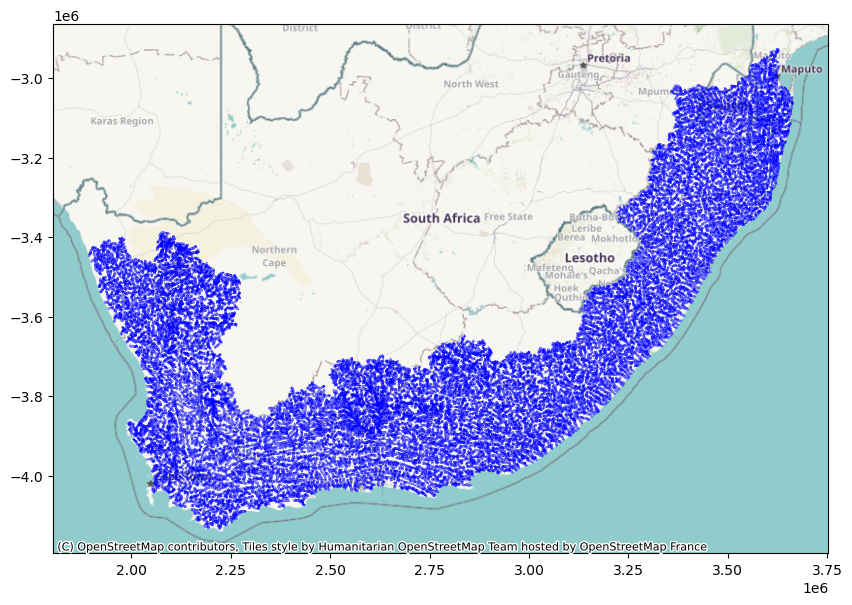

streams_105.gpkg
Size:  962371584
Download time: 128.8402111530304 seconds
Read time: 13.831753969192505 seconds


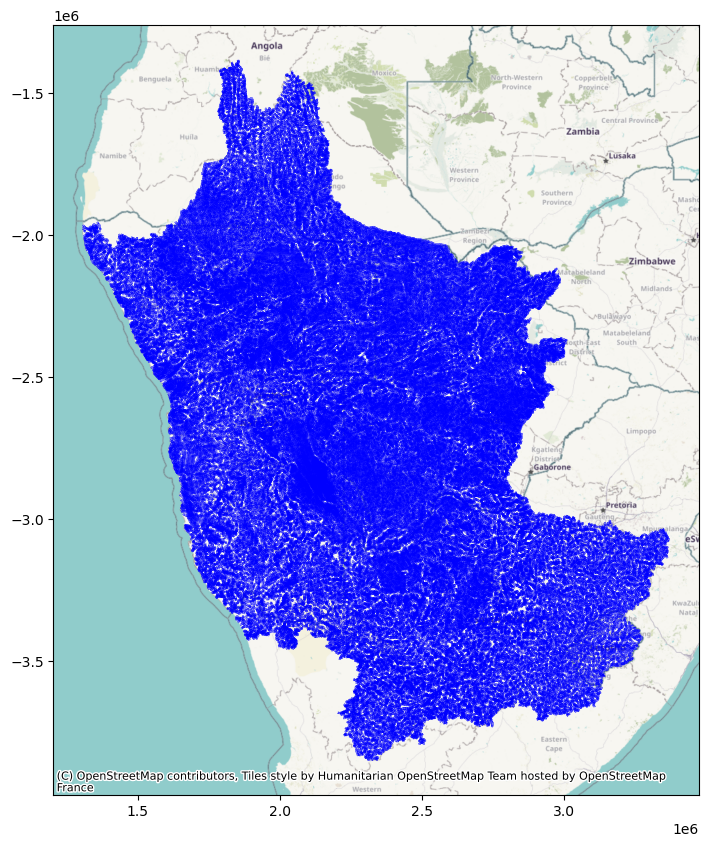

In [43]:
for stream_path in s3.ls('geoglows-v2/streams', detail=True)[:5]:
    last_slash_index = stream_path['Key'].rfind('/')
    stream = stream_path['Key'][last_slash_index + 1:]
    print(stream)
    print("Size: ", stream_path['Size'])
    local_path = Path('/Users/kbartels/Downloads/' + stream)

    # Download the file from S3
    start_time = time.time()  # Start measuring time
    s3.get_file(stream_path['Key'], local_path)
    download_time = time.time() - start_time  # Calculate download time
    print("Download time:", download_time, "seconds")

    # Read the file
    start_time = time.time()  # Start measuring time
    gdf = gpd.read_file(local_path, engine='pyogrio')
    read_time = time.time() - start_time  # Calculate read time
    print("Read time:", read_time, "seconds")

    # Plot and add basemap using contextily
    ax = gdf.plot(figsize=(10, 10), alpha=0.5, color='blue')
    ctx.add_basemap(ax)
    plt.show()


## Open and Visualize Data (pyogrio)

streams_106.gpkg
Size:  801505280
Download time: 89.87641954421997 seconds


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/282dac30b8a64cb986c7b8347bac05a2 has GPKG application_id, but non conformant file extension
  result = ogr_read(


Read time: 89.07324647903442 seconds


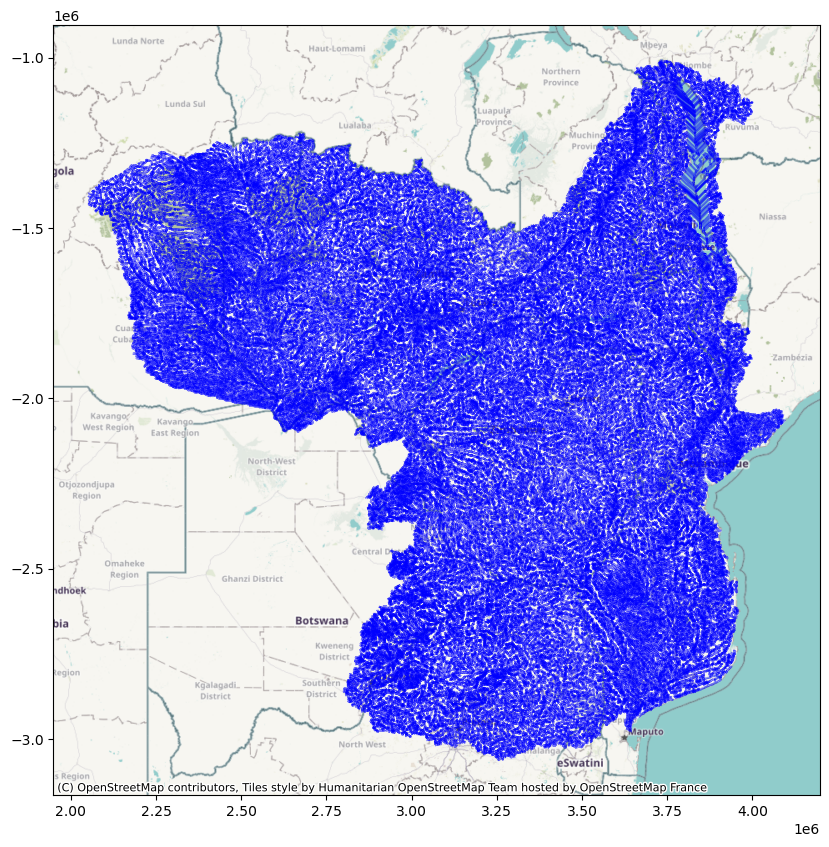

streams_107.gpkg
Size:  177209344
Download time: 22.87601923942566 seconds


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/4acfe7fc262b42978e460790ac506a14 has GPKG application_id, but non conformant file extension
  result = ogr_read(


Read time: 16.99028468132019 seconds


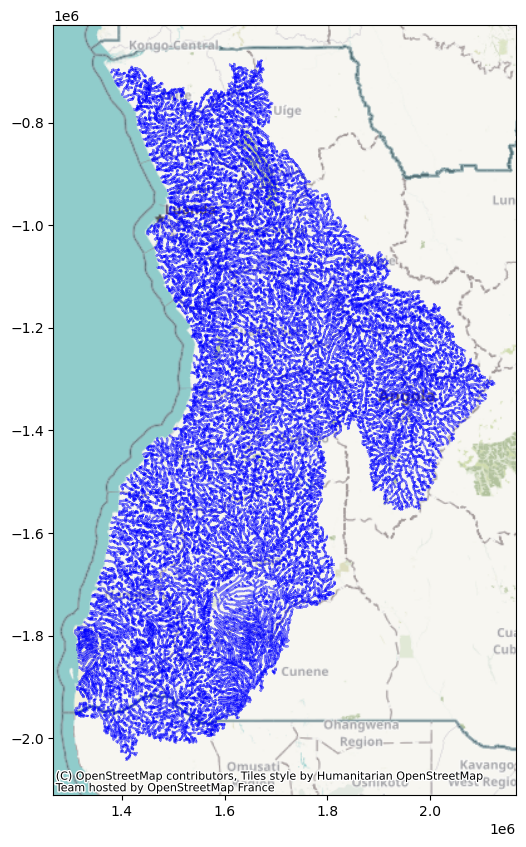

streams_108.gpkg
Size:  252928000
Download time: 22.549076795578003 seconds


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/83b299f1ce3b4bff852289a26ecf4c38 has GPKG application_id, but non conformant file extension
  result = ogr_read(


Read time: 26.963720083236694 seconds


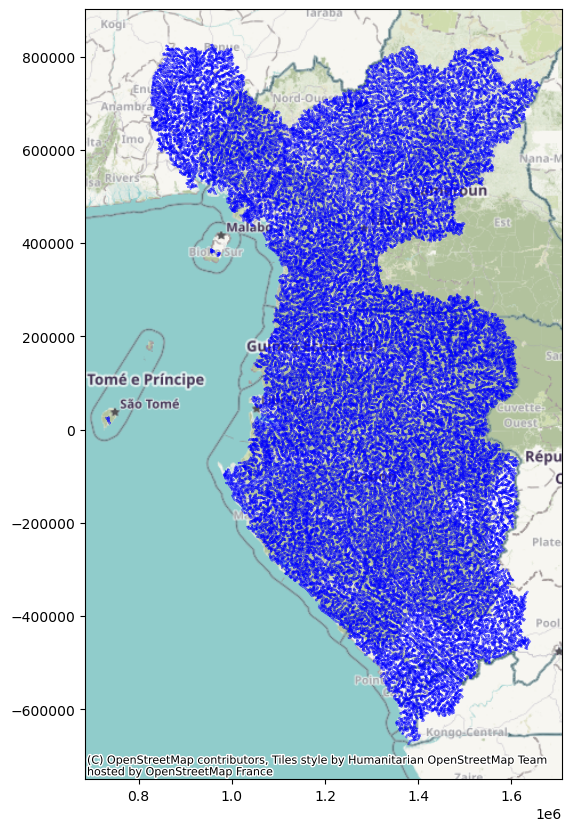

streams_109.gpkg
Size:  1283768320
Download time: 117.26376461982727 seconds


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/261325ec47ae4ad984c3e4c370232322 has GPKG application_id, but non conformant file extension
  result = ogr_read(


Read time: 139.76733684539795 seconds


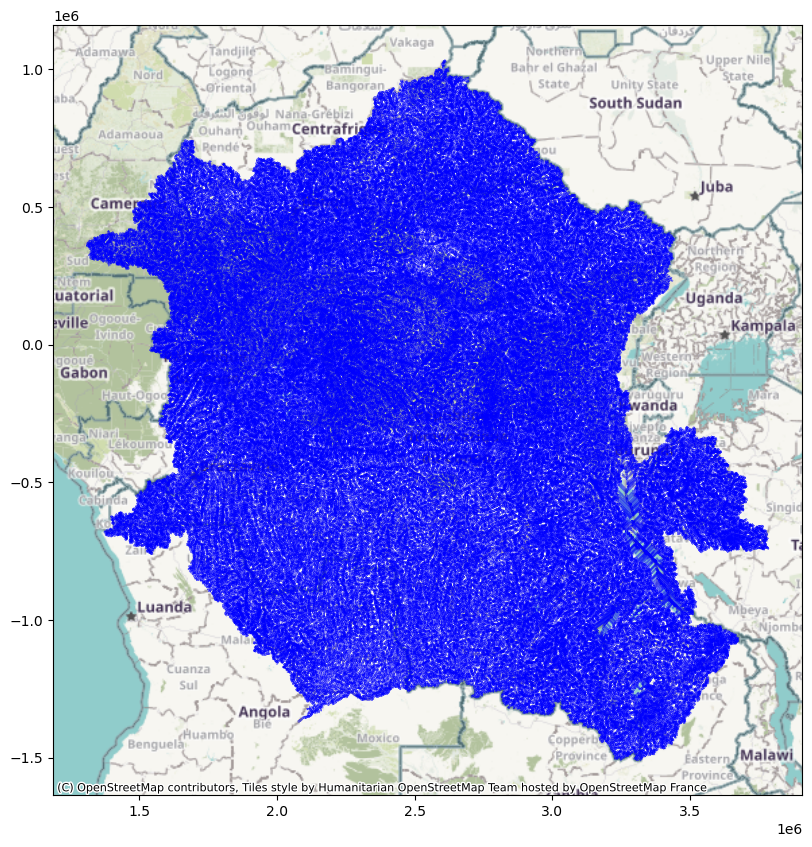

streams_110.gpkg
Size:  306221056
Download time: 47.02041530609131 seconds


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/05b72c00fa9d45099d5a1665a2443086 has GPKG application_id, but non conformant file extension
  result = ogr_read(


Read time: 34.407243967056274 seconds


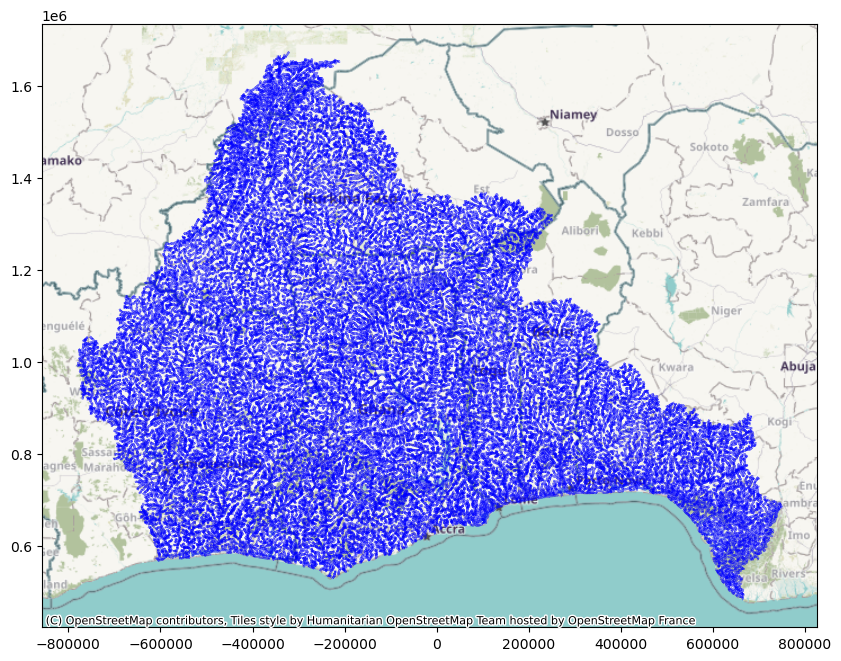

In [84]:
for stream_path in s3.ls('geoglows-v2/streams', detail=True)[5:10]:
    last_slash_index = stream_path['Key'].rfind('/')
    stream = stream_path['Key'][last_slash_index + 1:]
    print(stream)
    print("Size: ", stream_path['Size'])
    local_path = Path('/Users/kbartels/Downloads/' + stream)

    # Download the file from S3
    start_time = time.time()  # Start measuring time
    s3.get_file(stream_path['Key'], local_path)
    download_time = time.time() - start_time  # Calculate download time
    print("Download time:", download_time, "seconds")

    # Read the file
    start_time = time.time()  # Start measuring time
    gdf = pyogrio.read_dataframe(s3.open(stream_path['Key']), layer=0)
    read_time = time.time() - start_time  # Calculate read time
    print("Read time:", read_time, "seconds")

    # Plot and add basemap using contextily
    ax = gdf.plot(figsize=(10, 10), alpha=0.5, color='blue')
    ctx.add_basemap(ax)
    plt.show()


## Save file

In [85]:
s3_file_path = 'geoglows-v2/streams/streams_104.gpkg' # smallest of above

In [86]:
# Path to local copy
local_path = Path('/Users/kbartels/Downloads/streams_104.gpkg')

In [87]:
%%time
# Copy file to local path
s3.get_file(s3_file_path, local_path)

CPU times: total: 7.38 s
Wall time: 25.5 s


# Open GeoPackage File

## From Download

In [88]:
%%time
gdf = gpd.read_file(
    local_path, 
    engine='pyogrio',
    # use_arrow=True, # works, but seems to slow down rather than speed up reading
)

CPU times: total: 406 ms
Wall time: 1.47 s


In [51]:
gdf.head()

,LINKNO,DSLINKNO,strmOrder,USContArea,DSContArea,TDXHydroRegion,VPUCode,TopologicalOrder,LengthGeodesicMeters,TerminalLink,musk_k,musk_x,geometry
0,120318881,120383778,2,12420707.5,26240168.0,1020011530,104,301769,3344.568658,120520259,13378,0.25,"MULTILINESTRING ((3624661.571 -2929160.321, 36..."
1,120310563,120380453,2,10086299.5,23092552.0,1020011530,104,301851,3807.077161,120520259,15228,0.25,"MULTILINESTRING ((3621025.134 -2934105.501, 36..."
2,120332196,120377127,2,11474035.5,46985036.0,1020011530,104,301887,5588.780675,120520259,22355,0.25,"MULTILINESTRING ((3611216.650 -2936503.342, 36..."
3,120365480,120367144,2,11145956.0,26371372.0,1020011530,104,302043,658.226336,120520259,2633,0.25,"MULTILINESTRING ((3608779.990 -2944110.494, 36..."
4,120292265,120338858,2,11224480.5,15292500.0,1020011530,104,302089,1971.453691,120520259,7886,0.25,"MULTILINESTRING ((3600319.709 -2946098.593, 36..."


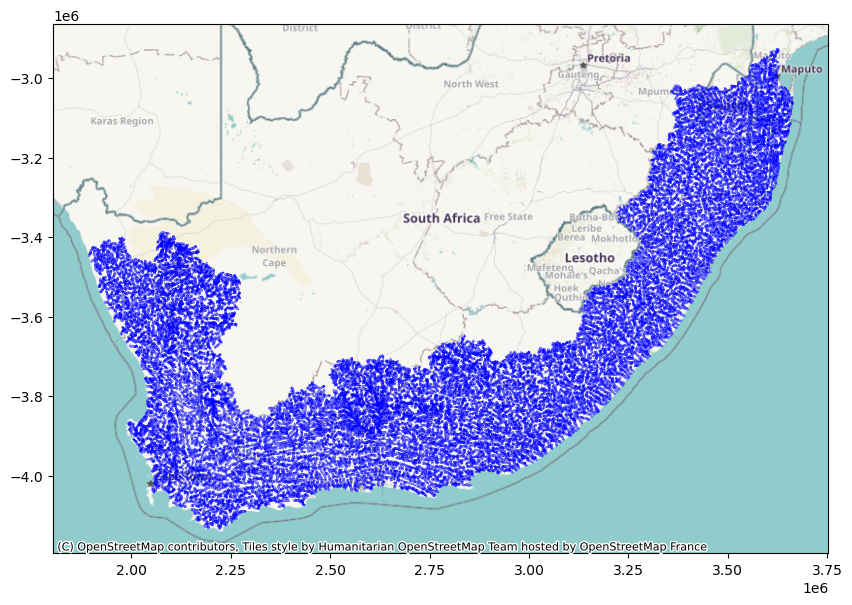

CPU times: total: 5.55 s
Wall time: 11.9 s


In [59]:
%%time
ax = gdf.plot(figsize=(10, 10), alpha=0.5, color='blue')

# Add basemap using contextily
ctx.add_basemap(ax)
plt.show()

[ 1892369.49932413 -4134400.55429727  3664860.27589628 -2925380.62843834]
[ 2500000 , -4200000 , 2750000 , -3800000 ]


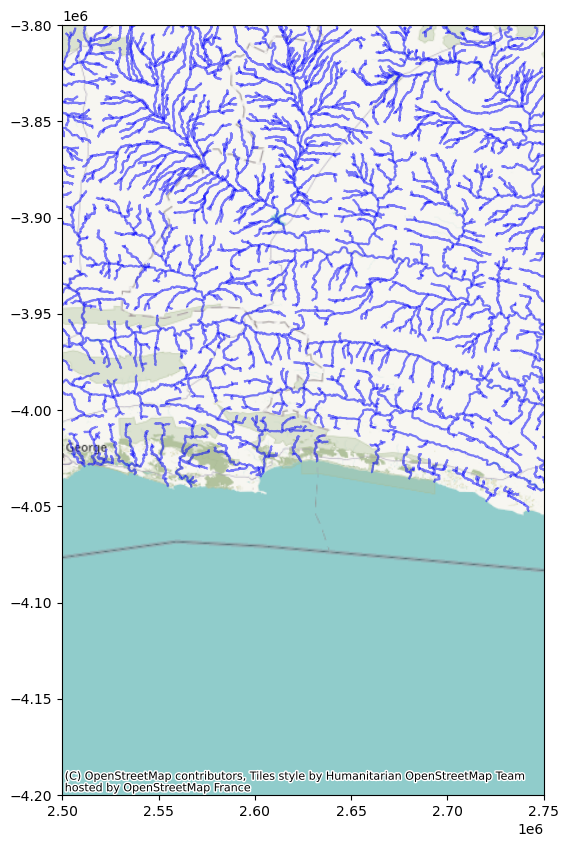

CPU times: total: 4.58 s
Wall time: 7.48 s


In [81]:
%%time
ax = gdf.plot(figsize=(10, 10), alpha=0.5, color='blue')

# Calculate the bounding box of the geometries
bbox = gdf.total_bounds
xmin, ymin, xmax, ymax = bbox
print(bbox)

# Define a buffer for the bounding box to adjust the extent
xmin = 2500000
ymin = -4200000
xmax = 2750000
ymax = -3800000

print('[', xmin, ',', ymin, ',', xmax, ',', ymax, ']')

# Set the extent of the plot
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Add basemap using contextily
ctx.add_basemap(ax)

# Show the plot
plt.show()

In [12]:
gdf.info()
gdf

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27579 entries, 0 to 27578
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   LINKNO                27579 non-null  int64   
 1   DSLINKNO              27579 non-null  int64   
 2   strmOrder             27579 non-null  int64   
 3   USContArea            27579 non-null  float64 
 4   DSContArea            27579 non-null  float64 
 5   TDXHydroRegion        27579 non-null  object  
 6   VPUCode               27579 non-null  int64   
 7   TopologicalOrder      27579 non-null  int64   
 8   LengthGeodesicMeters  27579 non-null  float64 
 9   TerminalLink          27579 non-null  int64   
 10  musk_k                27579 non-null  int64   
 11  musk_x                27579 non-null  float64 
 12  geometry              27579 non-null  geometry
dtypes: float64(4), geometry(1), int64(7), object(1)
memory usage: 2.7+ MB


,LINKNO,DSLINKNO,strmOrder,USContArea,DSContArea,TDXHydroRegion,VPUCode,TopologicalOrder,LengthGeodesicMeters,TerminalLink,musk_k,musk_x,geometry
0,120318881,120383778,2,1.242071e+07,2.624017e+07,1020011530,104,301769,3344.568658,120520259,13378,0.25,"MULTILINESTRING ((3624661.571 -2929160.321, 36..."
1,120310563,120380453,2,1.008630e+07,2.309255e+07,1020011530,104,301851,3807.077161,120520259,15228,0.25,"MULTILINESTRING ((3621025.134 -2934105.501, 36..."
2,120332196,120377127,2,1.147404e+07,4.698504e+07,1020011530,104,301887,5588.780675,120520259,22355,0.25,"MULTILINESTRING ((3611216.650 -2936503.342, 36..."
3,120365480,120367144,2,1.114596e+07,2.637137e+07,1020011530,104,302043,658.226336,120520259,2633,0.25,"MULTILINESTRING ((3608779.990 -2944110.494, 36..."
4,120292265,120338858,2,1.122448e+07,1.529250e+07,1020011530,104,302089,1971.453691,120520259,7886,0.25,"MULTILINESTRING ((3600319.709 -2946098.593, 36..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27574,120314400,120326049,6,3.280556e+10,3.281306e+10,1020011530,104,515554,3074.209381,120302758,5610,0.25,"LINESTRING (3011118.013 -3951393.024, 3011105...."
27575,120326049,120322724,6,3.282142e+10,3.283347e+10,1020011530,104,515583,5349.329721,120302758,9762,0.25,"LINESTRING (3013468.091 -3956447.526, 3013455...."
27576,120322724,120356005,6,3.285573e+10,3.286389e+10,1020011530,104,515611,4205.906940,120302758,7675,0.25,"LINESTRING (3017092.159 -3958968.190, 3017079...."
27577,120356005,120302758,6,3.305038e+10,3.305546e+10,1020011530,104,515638,3587.276534,120302758,6546,0.25,"LINESTRING (3020444.113 -3960985.117, 3020431...."


In [101]:
type(gdf.TDXHydroRegion.iloc[1])

str

## pyogrio

https://pyogrio.readthedocs.io

https://pyogrio.readthedocs.io/en/stable/api.html#pyogrio.read_dataframe


In [41]:
%%time
# Create S3File object. Always close it after use.
s3_file = s3.open(s3_file_path)
s3_file.info()

CPU times: total: 0 ns
Wall time: 996 µs


{'Key': 'geoglows-v2/streams/streams_104.gpkg',
 'LastModified': datetime.datetime(2024, 2, 1, 18, 28, 42, tzinfo=tzutc()),
 'ETag': '"3f5eaf05d888e2c3a046342ce8ed0dd0-24"',
 'Size': 192995328,
 'StorageClass': 'INTELLIGENT_TIERING',
 'type': 'file',
 'size': 192995328,
 'name': 'geoglows-v2/streams/streams_104.gpkg'}

In [42]:
%%time
pyogrio.list_layers(s3_file)

CPU times: total: 4.78 s
Wall time: 1min 26s


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\core.py:116: RuntimeWarning: File /vsimem/9c8e37543f86496281c249abd9fc4c71 has GPKG application_id, but non conformant file extension
  result = ogr_list_layers(path)


array([['streams_104', 'Unknown']], dtype=object)

pygrio seems to close s3_file after use!

In [43]:
%%time
# Reading info takes a variable amount of time, from 10 sec to >2 min!
# Similar as opening the file as a dataframe.
# by default, reads from the first layer
# for these files, layer 1 can't be opened
file_info = pyogrio.read_info(s3.open(s3_file_path), layer=0)
file_info

CPU times: total: 5.38 s
Wall time: 1min 25s


C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\core.py:261: RuntimeWarning: File /vsimem/45c8f39450d14fd290135754d44eb0af has GPKG application_id, but non conformant file extension
  result = ogr_read_info(


{'crs': 'EPSG:3857',
 'encoding': 'UTF-8',
 'fields': array(['LINKNO', 'DSLINKNO', 'strmOrder', 'USContArea', 'DSContArea',
        'TDXHydroRegion', 'VPUCode', 'TopologicalOrder',
        'LengthGeodesicMeters', 'TerminalLink', 'musk_k', 'musk_x'],
       dtype=object),
 'dtypes': array(['int64', 'int64', 'int64', 'float64', 'float64', 'object', 'int64',
        'int64', 'float64', 'int64', 'int64', 'float64'], dtype=object),
 'geometry_type': 'Unknown',
 'features': 27579,
 'total_bounds': (1892369.49932413,
  -4134400.55429727,
  3664860.27589628,
  -2925380.62843834),
 'driver': 'GPKG',
 'capabilities': {'random_read': True,
  'fast_set_next_by_index': False,
  'fast_spatial_filter': True,
  'fast_feature_count': True,
  'fast_total_bounds': True},
 'layer_metadata': None,
 'dataset_metadata': None}

In [44]:
%%time
# Reading info takes a variable amount of time, from 10 sec to >2 min!
# Similar as opening the file as a dataframe.
# by default, reads from the first layer
# for these files, layer 1 can't be opened
gdf = pyogrio.read_dataframe(
    s3.open(s3_file_path), 
    # use_arrow=True, # doesn't seem to work with s3
    layer=0,
)

C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/feaa1d852cf14c94b0d770d31445ce01 has GPKG application_id, but non conformant file extension
  result = ogr_read(


CPU times: total: 8.77 s
Wall time: 1min 40s


In [45]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27579 entries, 0 to 27578
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   LINKNO                27579 non-null  int64   
 1   DSLINKNO              27579 non-null  int64   
 2   strmOrder             27579 non-null  int64   
 3   USContArea            27579 non-null  float64 
 4   DSContArea            27579 non-null  float64 
 5   TDXHydroRegion        27579 non-null  object  
 6   VPUCode               27579 non-null  int64   
 7   TopologicalOrder      27579 non-null  int64   
 8   LengthGeodesicMeters  27579 non-null  float64 
 9   TerminalLink          27579 non-null  int64   
 10  musk_k                27579 non-null  int64   
 11  musk_x                27579 non-null  float64 
 12  geometry              27579 non-null  geometry
dtypes: float64(4), geometry(1), int64(7), object(1)
memory usage: 2.7+ MB


In [46]:
# Always close the file, or use a context manager (i.e. `with`)
# This seems to get closed by pyogrio
s3_file.close()

## GeoPandas
https://geopandas.org/en/stable/docs/reference/api/geopandas.read_file.html

In [106]:
%%time
gdf = gpd.read_file(
    s3.open(s3_file_path), 
    engine='pyogrio',
    # use_arrow=True, # kwarg for pyogrio.read_dataframe(), but doesn't seem to work with s3
)

C:\Users\kbartels\AppData\Local\miniconda3\envs\pangeo\Lib\site-packages\pyogrio\raw.py:194: RuntimeWarning: File /vsimem/9e8f1ee7cd1749aeaf00fdf1648e1dc5 has GPKG application_id, but non conformant file extension
  result = ogr_read(


CPU times: total: 5.8 s
Wall time: 23.8 s


In [107]:
gdf.info()
gdf

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27579 entries, 0 to 27578
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   LINKNO                27579 non-null  int64   
 1   DSLINKNO              27579 non-null  int64   
 2   strmOrder             27579 non-null  int64   
 3   USContArea            27579 non-null  float64 
 4   DSContArea            27579 non-null  float64 
 5   TDXHydroRegion        27579 non-null  object  
 6   VPUCode               27579 non-null  int64   
 7   TopologicalOrder      27579 non-null  int64   
 8   LengthGeodesicMeters  27579 non-null  float64 
 9   TerminalLink          27579 non-null  int64   
 10  musk_k                27579 non-null  int64   
 11  musk_x                27579 non-null  float64 
 12  geometry              27579 non-null  geometry
dtypes: float64(4), geometry(1), int64(7), object(1)
memory usage: 2.7+ MB


,LINKNO,DSLINKNO,strmOrder,USContArea,DSContArea,TDXHydroRegion,VPUCode,TopologicalOrder,LengthGeodesicMeters,TerminalLink,musk_k,musk_x,geometry
0,120318881,120383778,2,1.242071e+07,2.624017e+07,1020011530,104,301769,3344.568658,120520259,13378,0.25,"MULTILINESTRING ((3624661.571 -2929160.321, 36..."
1,120310563,120380453,2,1.008630e+07,2.309255e+07,1020011530,104,301851,3807.077161,120520259,15228,0.25,"MULTILINESTRING ((3621025.134 -2934105.501, 36..."
2,120332196,120377127,2,1.147404e+07,4.698504e+07,1020011530,104,301887,5588.780675,120520259,22355,0.25,"MULTILINESTRING ((3611216.650 -2936503.342, 36..."
3,120365480,120367144,2,1.114596e+07,2.637137e+07,1020011530,104,302043,658.226336,120520259,2633,0.25,"MULTILINESTRING ((3608779.990 -2944110.494, 36..."
4,120292265,120338858,2,1.122448e+07,1.529250e+07,1020011530,104,302089,1971.453691,120520259,7886,0.25,"MULTILINESTRING ((3600319.709 -2946098.593, 36..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27574,120314400,120326049,6,3.280556e+10,3.281306e+10,1020011530,104,515554,3074.209381,120302758,5610,0.25,"LINESTRING (3011118.013 -3951393.024, 3011105...."
27575,120326049,120322724,6,3.282142e+10,3.283347e+10,1020011530,104,515583,5349.329721,120302758,9762,0.25,"LINESTRING (3013468.091 -3956447.526, 3013455...."
27576,120322724,120356005,6,3.285573e+10,3.286389e+10,1020011530,104,515611,4205.906940,120302758,7675,0.25,"LINESTRING (3017092.159 -3958968.190, 3017079...."
27577,120356005,120302758,6,3.305038e+10,3.305546e+10,1020011530,104,515638,3587.276534,120302758,6546,0.25,"LINESTRING (3020444.113 -3960985.117, 3020431...."


# Save to GeoParquet

In [108]:
gdf.set_index('LINKNO', inplace=True)
gdf.sort_index(inplace=True)

In [109]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 27579 entries, 120004647 to 120665073
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   DSLINKNO              27579 non-null  int64   
 1   strmOrder             27579 non-null  int64   
 2   USContArea            27579 non-null  float64 
 3   DSContArea            27579 non-null  float64 
 4   TDXHydroRegion        27579 non-null  object  
 5   VPUCode               27579 non-null  int64   
 6   TopologicalOrder      27579 non-null  int64   
 7   LengthGeodesicMeters  27579 non-null  float64 
 8   TerminalLink          27579 non-null  int64   
 9   musk_k                27579 non-null  int64   
 10  musk_x                27579 non-null  float64 
 11  geometry              27579 non-null  geometry
dtypes: float64(4), geometry(1), int64(6), object(1)
memory usage: 2.7+ MB


In [110]:
local_path

WindowsPath('/Users/kbartels/Downloads/streams_104.gpkg')

In [111]:
gdf.to_parquet(
    local_path.with_suffix('.parquet'),
    compression='brotli',
)

In [112]:
type(gdf.strmOrder.iloc[0])

numpy.int64

In [113]:
local_path.with_suffix('.parquet').exists()

True

## Compare size

In [55]:
os.path.getsize(local_path)

192995328

In [57]:
os.path.getsize(local_path.with_suffix('.parquet'))

43175445

In [58]:
%%time
gdf = gpd.read_parquet(local_path.with_suffix('.parquet'))

CPU times: total: 1.42 s
Wall time: 3.62 s


In [59]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 27579 entries, 120004647 to 120665073
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   DSLINKNO              27579 non-null  int64   
 1   strmOrder             27579 non-null  int64   
 2   USContArea            27579 non-null  float64 
 3   DSContArea            27579 non-null  float64 
 4   TDXHydroRegion        27579 non-null  object  
 5   VPUCode               27579 non-null  int64   
 6   TopologicalOrder      27579 non-null  int64   
 7   LengthGeodesicMeters  27579 non-null  float64 
 8   TerminalLink          27579 non-null  int64   
 9   musk_k                27579 non-null  int64   
 10  musk_x                27579 non-null  float64 
 11  geometry              27579 non-null  geometry
dtypes: float64(4), geometry(1), int64(6), object(1)
memory usage: 2.7+ MB
